<a href="https://colab.research.google.com/github/fazekas-gergo/composer-ai/blob/note-classification/Composer_AI_2_models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Composer AI
Authors: Fazekas Gergő and Joseph Tadrous<br>
Used dataset: https://www.kaggle.com/soumikrakshit/classical-music-midi

---
## 1. First steps
At first clone the repository (which also contains the dataset) and install the required packages.

In [ ]:
!git clone -l -s https://github.com/fazekas-gergo/composer-ai composer-ai
%cd composer-ai
!pip install midi2audio
!pip install py_midicsv
!pip install pretty_midi
!sudo apt-get install fluidsynth

In [ ]:
import os
import pretty_midi
import collections
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import music21
from sklearn.preprocessing import MinMaxScaler
from numpy.lib.stride_tricks import sliding_window_view
from datetime import datetime
import subprocess


from midi2audio import FluidSynth
from IPython.display import Audio
from tensorflow import keras
from keras.layers import LSTM, Dense, Dropout, Embedding, Input
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from keras.models import Sequential
from keras.initializers import HeNormal

Multiple times used functions

In [ ]:
def convert_midi_to_flac(music_path, output='music'):
  FluidSynth('piano.sf2').midi_to_audio(music_path, 'music' + '.flac')
  return 'music' + '.flac'

def play_music(music_path):
  convert_midi_to_flac(music_path, output='music')
  return 'music.flac'



def instrument_to_df(instrument):
    notes = collections.defaultdict(list)
    # Sort the notes by start time
    sorted_notes = sorted(instrument.notes, key=lambda note: note.start)
    prev_start = sorted_notes[0].start
    for note in sorted_notes:
      start = note.start
      end = note.end
      notes['pitch'].append(note.pitch)
      notes['step'].append(start - prev_start)
      notes['duration'].append(end - start)
      prev_start = start
    return pd.DataFrame({name: np.array(value) for name, value in notes.items()})

def midi_file_to_df(midi_file):
  m = pretty_midi.PrettyMIDI(midi_file)
  return pd.concat([instrument_to_df(instrument) for instrument in m.instruments])

def midi_files_to_df(midi_files):
  return pd.concat([midi_file_to_df(f) for f in midi_files])



def tokenize_notes(notes, steps):
  tokenized = np.zeros((len(notes), 108-21))
  for i, note in enumerate(notes):
      tokenized[i, note - 21] = 1
  return tokenized

def get_note_from_token(token):
  return np.argmax(token) + 21

def create_X_Y(df, win_len):
  X = sliding_window_view(df.drop(df.tail(1).index), window_shape=(win_len, df.shape[1]))
  X = X.reshape(X.shape[0], X.shape[2], X.shape[3])
  Y = df.drop(range(win_len), axis='index').values
  return X, Y

def save_and_zip_model(model, name):
  path = "models/" + name + str(datetime.now().strftime("%m-%d-%Y_%H-%M-%S"))
  model.save(path)
  # Zip model to be downloadable
  subprocess.call(['zip', '-r', path + ".zip", path])

---
## 2. Data Familiarization
The *convert_midi_to_flac* function is able to convert the midi file to be listenable by using a soundfont file.

In [ ]:
Audio(play_music('classical_music_midi/mozart/mz_331_3.mid'))

The *music21* package lets us to plot the midi file.

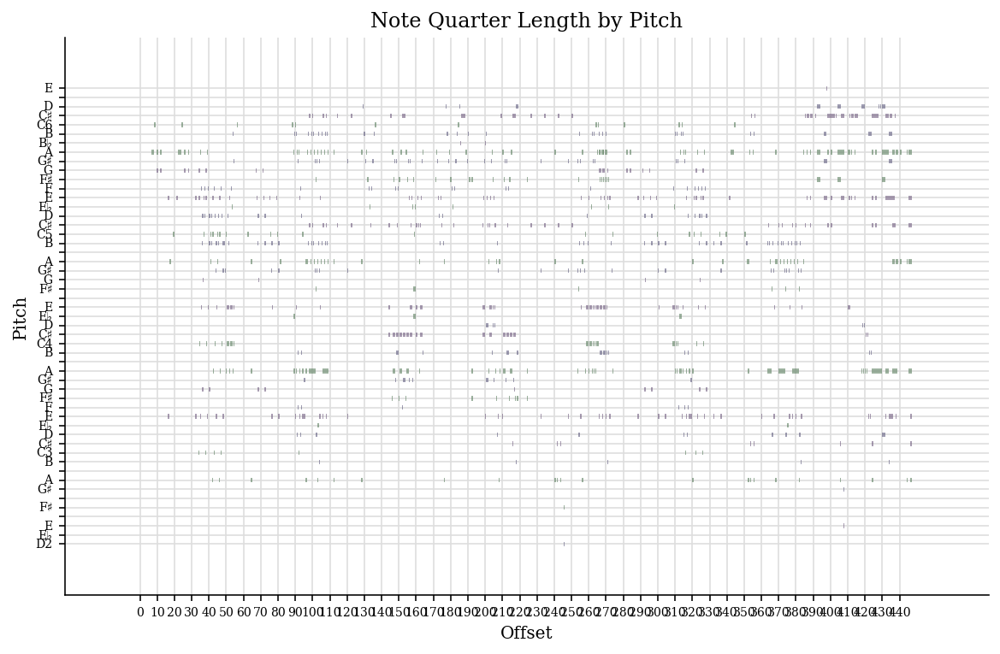

In [ ]:
music = music21.converter.parse('classical_music_midi/mozart/mz_331_3.mid')
music.plot()

---
## 3. Data preparation
At first let's create a list, which contains all the midi files from the dataset.

In [ ]:
def get_midi_files(main_folder):
  files = []
  for dir in os.listdir(main_folder):
    for file in os.listdir(main_folder + os.path.sep + dir):
      files.append(main_folder + os.path.sep + dir + os.path.sep + file)
  return files

midi_files = get_midi_files('classical_music_midi')
print('Number of read MIDI files:', len(midi_files))

Number of read MIDI files: 295


Secondly, create a pandas data frame filled with the pitches and durations of the notes sorted by the start time.<br>

In [ ]:
df = midi_files_to_df(['classical_music_midi/mozart/mz_331_3.mid'])
df.describe()

,pitch,step,duration
count,2819.000000,2819.000000,2819.000000
mean,67.044697,0.133719,0.125214
std,12.275440,0.137028,0.111847
min,38.000000,0.000000,0.003759
25%,57.000000,0.035211,0.100000
50%,69.000000,0.105634,0.104167
75%,78.000000,0.206896,0.111940
max,88.000000,1.004854,0.887254


### Create X, Y matrices for training the note classifier model.

In [ ]:
df_tokenized = pd.DataFrame(tokenize_notes(df.pitch, df.step))
df_tokenized.head(1)

,0,1,2,3,4,5,6,7,8,9,...,77,78,79,80,81,82,83,84,85,86
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Window data as well

In [ ]:
win_len = 32
X_note, Y_note = create_X_Y(df_tokenized, win_len)
X_note[0, 0]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0.])

### Create X and Y matrices for step and duration regressor model

In [ ]:
s_d_scaler = MinMaxScaler()
s_d_scaler.fit(df)
scaled = s_d_scaler.transform(df)
df_scaled = pd.DataFrame(scaled, columns=['pitch','step','duration'])

df_scaled.describe()

,pitch,step,duration
count,2819.000000,2819.000000,2819.000000
mean,0.580894,0.133073,0.137471
std,0.245509,0.136366,0.126596
min,0.000000,0.000000,0.000000
25%,0.380000,0.035041,0.108932
50%,0.620000,0.105123,0.113648
75%,0.800000,0.205897,0.122447
max,1.000000,1.000000,1.000000


In [ ]:
X_s_d, Y_s_d = create_X_Y(df_scaled, win_len)
# Remove pitch from Y
Y_s_d = Y_s_d[:, 1:]
X_s_d.shape, Y_s_d.shape

((2787, 32, 3), (2787, 2))



---
# 4. Training
The are two models:
*   **Note classifier**: predicts the next note from the previous note as a classification problem.
*   **Step, duration regressor**: predicts the next step and duration value from the note, step and duration values.

### Note classifier

In [ ]:
note_classifier = Sequential(name='note_classifier')
note_classifier.add(LSTM(32, input_shape=(X_note.shape[1:]), name='lstm')),
note_classifier.add(Dense(100, activation='relu', kernel_initializer=HeNormal(), name='dense_1')),
note_classifier.add(Dense(100, activation='relu', kernel_initializer=HeNormal(), name='dense_2')),
note_classifier.add(Dense(100, activation='relu', kernel_initializer=HeNormal(), name='dense_3')),
note_classifier.add(Dense(100, activation='relu', kernel_initializer=HeNormal(), name='dense_4')),
note_classifier.add(Dense(87, activation='softmax', name='output'))

note_classifier.compile(loss=keras.losses.CategoricalCrossentropy(), optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])
note_classifier.summary()

Model: "note_classifier"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 32)                15360     
                                                                 
 dense_1 (Dense)             (None, 100)               3300      
                                                                 
 dense_2 (Dense)             (None, 100)               10100     
                                                                 
 dense_3 (Dense)             (None, 100)               10100     
                                                                 
 dense_4 (Dense)             (None, 100)               10100     
                                                                 
 output (Dense)              (None, 87)                8787      
                                                                 
Total params: 57,747
Trainable params: 57,747
Non-t

In [ ]:
es = EarlyStopping(patience=10, monitor='loss', restore_best_weights=True, verbose=10)
note_classifier.fit(X_note, Y_note, epochs=1000, callbacks=[es], batch_size=128)

Save model

In [ ]:
save_and_zip_model(note_classifier, 'note_classifier')

INFO:tensorflow:Assets written to: models/note_classifier04-02-2022_16-17-27/assets


INFO:tensorflow:Assets written to: models/note_classifier04-02-2022_16-17-27/assets


### Step, duration regressor

In [ ]:
s_d_regressor = Sequential(name='step_duration_regressor')
s_d_regressor.add(LSTM(32, input_shape=(X_s_d.shape[1:]))),
s_d_regressor.add(Dense(100, activation='relu', kernel_initializer=HeNormal())),
s_d_regressor.add(Dense(100, activation='relu', kernel_initializer=HeNormal())),
s_d_regressor.add(Dense(100, activation='relu', kernel_initializer=HeNormal())),
s_d_regressor.add(Dense(100, activation='relu', kernel_initializer=HeNormal())),
s_d_regressor.add(Dense(2, activation='softmax', name='output'))

s_d_regressor.compile(loss=keras.losses.MeanSquaredError(), optimizer=keras.optimizers.Adam(learning_rate=0.0001))
s_d_regressor.summary()

Model: "step_duration_regressor"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 32)                4608      
                                                                 
 dense_9 (Dense)             (None, 100)               3300      
                                                                 
 dense_10 (Dense)            (None, 100)               10100     
                                                                 
 dense_11 (Dense)            (None, 100)               10100     
                                                                 
 dense_12 (Dense)            (None, 100)               10100     
                                                                 
 output (Dense)              (None, 2)                 202       
                                                                 
Total params: 38,410
Trainable params: 38,4

In [ ]:
es = keras.callbacks.EarlyStopping(patience=20, monitor='loss', restore_best_weights=True, verbose=10)
s_d_regressor.fit(X_s_d, Y_s_d, epochs=100, callbacks=[es], batch_size=32)

save model

In [ ]:
save_and_zip_model(s_d_regressor, 's_d_regressor')

INFO:tensorflow:Assets written to: models/s_d_regressor04-02-2022_16-18-30/assets


INFO:tensorflow:Assets written to: models/s_d_regressor04-02-2022_16-18-30/assets




---
# Output
Write output into a midi file and listen it


In [97]:
num_generate = 200

In [98]:
def generate_notes(num: int):
  num = num + win_len
  out = np.zeros(shape=(num, 87))
  for i in range(num-win_len):
    input = out[i:i+win_len].reshape(win_len, 87)
    new_pred = note_classifier.predict(out[i:i+win_len].reshape(1, win_len, 87)).reshape(87)
    out[i+win_len] = new_pred
  out = out[win_len:]
  return [get_note_from_token(token) for token in out]

generated_notes = generate_notes(num_generate)
#predictions = pd.DataFrame(predictions, columns=['pitch',	'step',	'duration'])
print(generated_notes)

[81, 69, 81, 69, 77, 74, 72, 71, 72, 76, 72, 77, 76, 74, 72, 68, 71, 64, 72, 69, 74, 71, 76, 72, 76, 72, 77, 76, 74, 72, 68, 71, 71, 69, 68, 69, 72, 74, 72, 71, 72, 76, 77, 76, 75, 76, 83, 81, 80, 81, 83, 81, 80, 81, 84, 81, 83, 84, 83, 81, 80, 81, 76, 77, 74, 72, 71, 72, 71, 72, 71, 72, 71, 69, 71, 69, 76, 71, 81, 69, 83, 71, 85, 73, 81, 69, 83, 71, 85, 73, 83, 71, 81, 69, 80, 68, 78, 66, 83, 71, 80, 68, 76, 64, 81, 69, 83, 71, 85, 73, 81, 69, 83, 71, 85, 73, 83, 71, 81, 69, 80, 68, 78, 66, 83, 71, 80, 68, 76, 64, 81, 69, 83, 71, 85, 73, 81, 69, 83, 71, 85, 73, 83, 71, 81, 69, 80, 68, 78, 66, 83, 71, 80, 68, 76, 64, 81, 69, 83, 71, 85, 73, 81, 69, 83, 71, 85, 73, 83, 71, 81, 69, 80, 68, 78, 66, 83, 71, 80, 68, 76, 64, 81, 69, 83, 71, 85, 73, 81, 69, 83, 71, 85, 73, 83, 71, 81, 69, 80, 68]


In [99]:
def generate_step_and_duration(num, notes):
  num = num + win_len
  out = np.zeros(shape=(num, 3))

  out[win_len:, 0] = notes
  out = s_d_scaler.transform(out)

  for i in range(num-win_len):
    input = out[i:i+win_len].reshape(win_len, 3)
    new_pred = s_d_regressor.predict(out[i:i+win_len].reshape(1, win_len, 3)).reshape(2)
    out[i+win_len, 1:3] = new_pred

  out = out[win_len:]
  return s_d_scaler.inverse_transform(out)[:, 1:3]

generated_s_d = generate_step_and_duration(num_generate, generated_notes)
generated_s_d = generated_s_d/8

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  "X does not have valid feature names, but"


In [100]:
generated_values = np.zeros(shape=(num_generate, 3))
generated_values[:, 0] = generated_notes
generated_values[:, 1:3] = generated_s_d

generated_piece = pd.DataFrame(generated_values, columns=['pitch',	'step',	'duration'])
generated_piece

,pitch,step,duration
0,81.0,0.036530,0.078789
1,69.0,0.022177,0.091408
2,81.0,0.013207,0.099294
3,69.0,0.009307,0.102723
4,77.0,0.007401,0.104400
...,...,...,...
195,71.0,0.075576,0.044458
196,81.0,0.078218,0.042136
197,69.0,0.075888,0.044184
198,80.0,0.078681,0.041728


In [101]:
music = pretty_midi.PrettyMIDI()
piano = pretty_midi.Instrument(program=pretty_midi.instrument_name_to_program('Acoustic Grand Piano'))

start = 0
for index, p in generated_piece.iterrows():
  note_number = round(p.pitch)
  note = pretty_midi.Note(velocity=100, pitch=note_number, 
                          start=start, end=start+p.duration)
  piano.notes.append(note)
  start += p.step

# Add the piano instrument to the PrettyMIDI object
music.instruments.append(piano)
# Write out the MIDI data
music.write('output.mid')

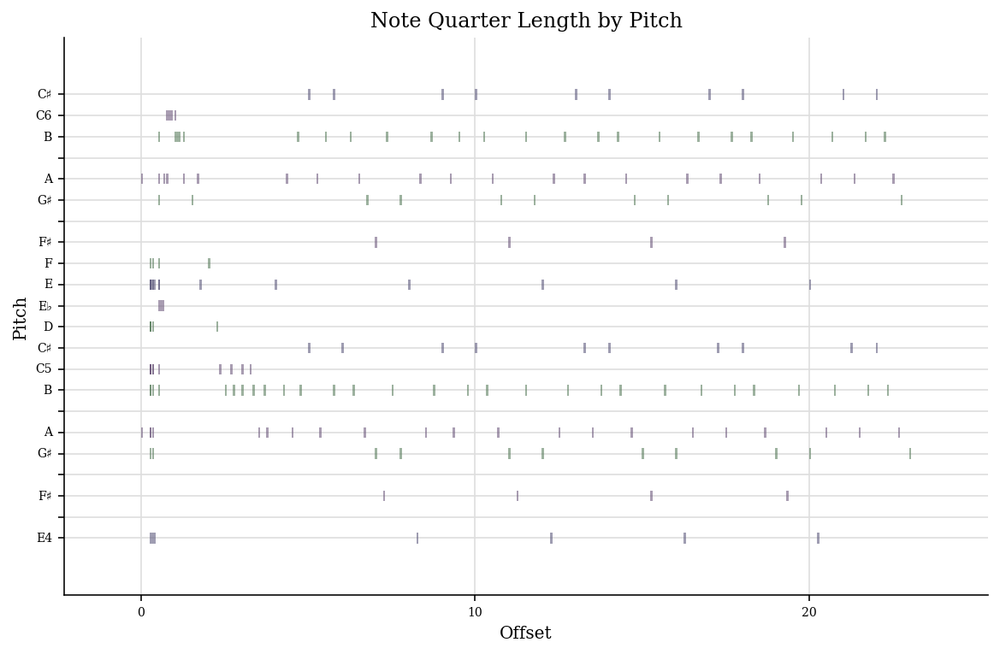

In [102]:
music = music21.converter.parse('output.mid')
music.plot()

In [103]:
Audio(play_music('output.mid'))